# Build some toy models and how to sample them

In [1]:
# use autoreload
%load_ext autoreload
%autoreload 2

import yaml
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch

# import lightning trainer
import lightning as L
from lightning.pytorch.loggers import WandbLogger

# imports
from jepa.modules import JEPA

## Explore Model Loading

In [2]:
with open("configs/11_testing.yaml", "r") as f:
    config = yaml.load(f, Loader=yaml.FullLoader)

In [8]:
model = JEPA(**config)


In [9]:
for batch in model.train_dataloader():
    x, mask, pids, edge_index, edge_mask, y, events_df = batch["x"], batch["mask"], batch["pids"], batch["edge_index"], batch["edge_mask"], batch["y"], batch["event"]
    print(x.shape, mask.shape)

    break

torch.Size([200, 20, 4, 2]) torch.Size([200, 20, 4])


## Train Run

In [2]:
with open("configs/11_testing.yaml", "r") as f:
    config = yaml.load(f, Loader=yaml.FullLoader)

In [3]:
model = JEPA(**config)

/global/homes/d/danieltm/.conda/envs/jepa/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /global/homes/d/danieltm/.conda/envs/jepa/lib/python ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA A100-PCIE-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type       | Params
-------------------------------------------
0 | encoder     | Encoder    | 73.3 K
1 | ema_encoder | Encoder    | 73.3 K
2 | predictor   | Sequential | 18.7 K
-------------------------------------------
92.0 K    Trainable params
73.3 K    Non-trainable params
165 K     Total params
0.661     Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]Batch shapes: x=torch.Size([200, 20, 4, 2]), mask=torch.Size([200, 20, 4]), pids=torch.Size([200, 20]), edge_index=torch.Size([200, 190, 2]), edge_mask=torch.Size([200, 190]), y=torch.Size([200, 190])
Max edge index: 19
Distances shape: torch.Size([38000])
Sample distances: tensor([0.9369, 0.9903, 0.9868, 0.9778, 0.9726], device='cuda:0')


/global/homes/d/danieltm/.conda/envs/jepa/lib/python3.10/site-packages/lightning/pytorch/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 200. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


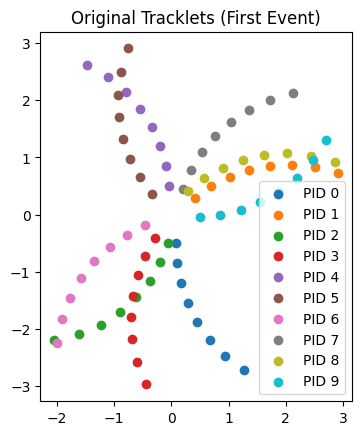

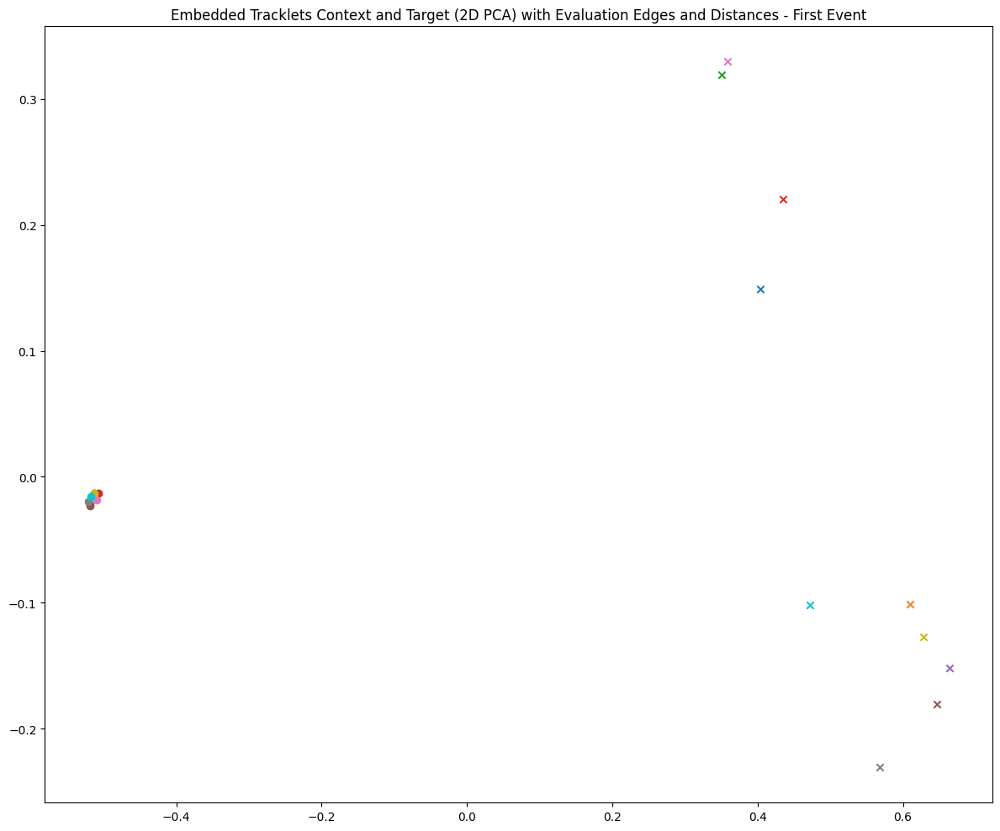

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 1.0477
  Mean Fake Distance: 1.0483
Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:01<00:01,  0.53it/s]Batch shapes: x=torch.Size([200, 20, 4, 2]), mask=torch.Size([200, 20, 4]), pids=torch.Size([200, 20]), edge_index=torch.Size([200, 190, 2]), edge_mask=torch.Size([200, 190]), y=torch.Size([200, 190])
Max edge index: 19
Distances shape: torch.Size([38000])
Sample distances: tensor([1.1800, 1.1812, 1.1778, 1.1876, 1.1789], device='cuda:0')
Epoch 0:   0%|          | 0/100 [00:00<?, ?it/s]                           Starting first training step...
Batch shapes: x=torch.Size([200, 20, 4, 2]), mask=torch.Size([200, 20, 4]), pids=torch.Size([200, 20]), edge_index=torch.Size([200, 190, 2]), edge_mask=torch.Size([200, 190]), y=torch.Size([200, 190])
Embedded context tracklets shape: torch.Size([200, 20, 8])
Embedded target tracklets shape: torch.Size([200, 20, 8])
Predicted embedded target tracklets shape:

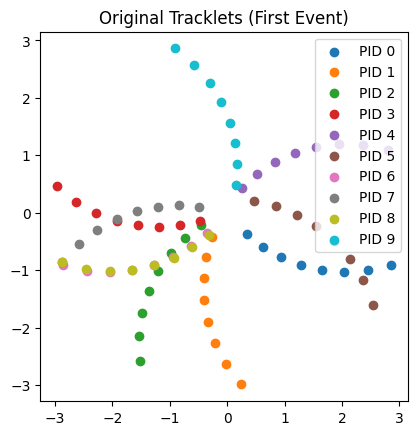

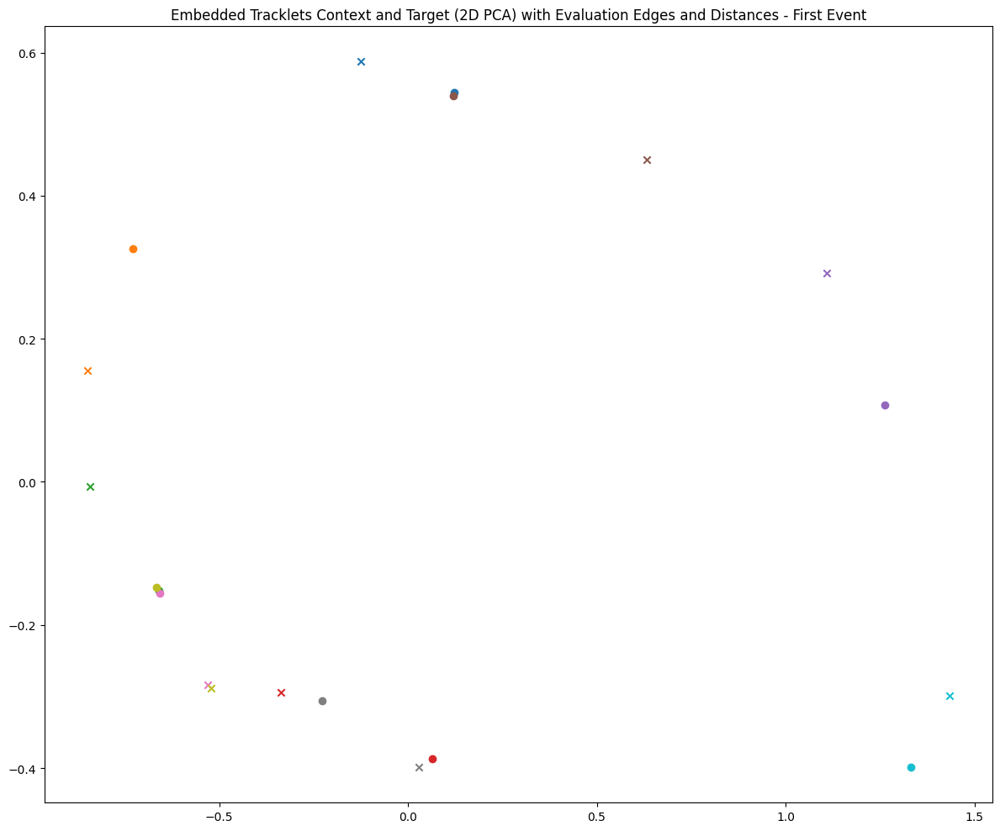

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.2426
  Mean Fake Distance: 1.1259
Epoch 1: 100%|██████████| 100/100 [00:23<00:00,  4.34it/s, v_num=2xdj]

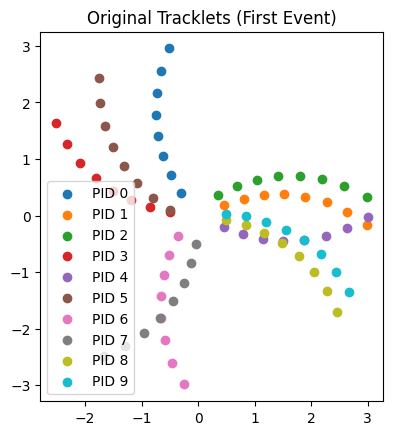

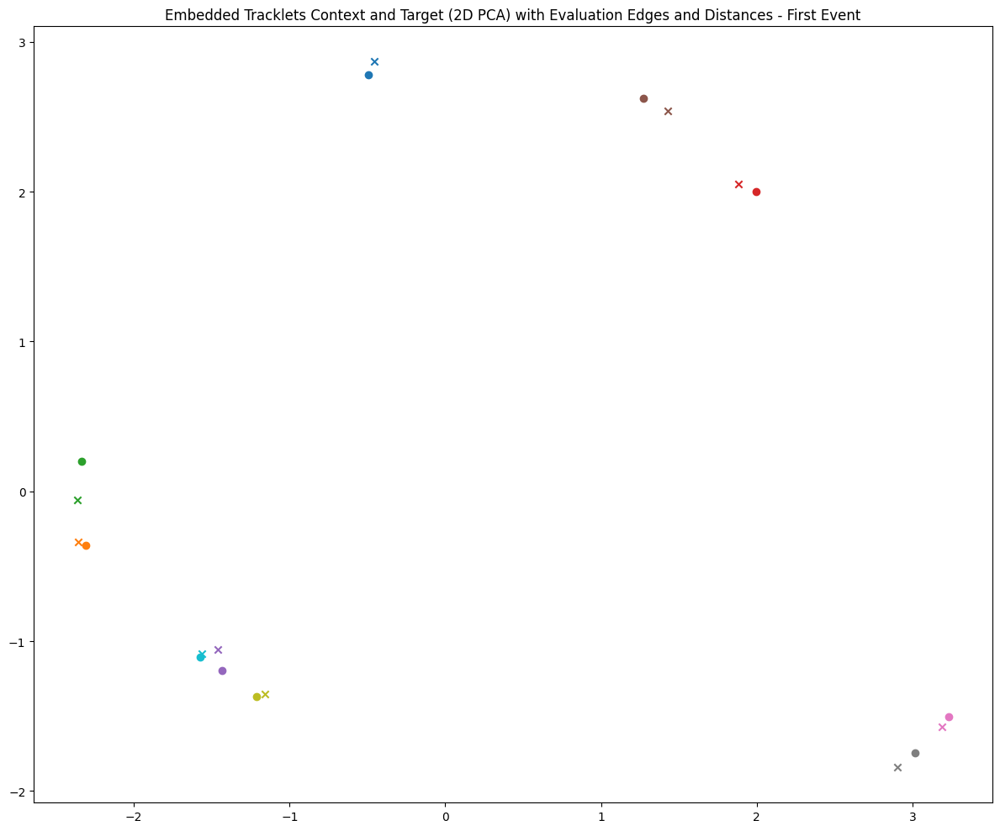

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.1877
  Mean Fake Distance: 3.6130
Epoch 2: 100%|██████████| 100/100 [00:22<00:00,  4.36it/s, v_num=2xdj]

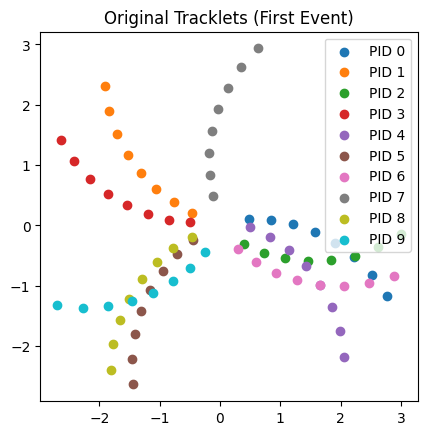

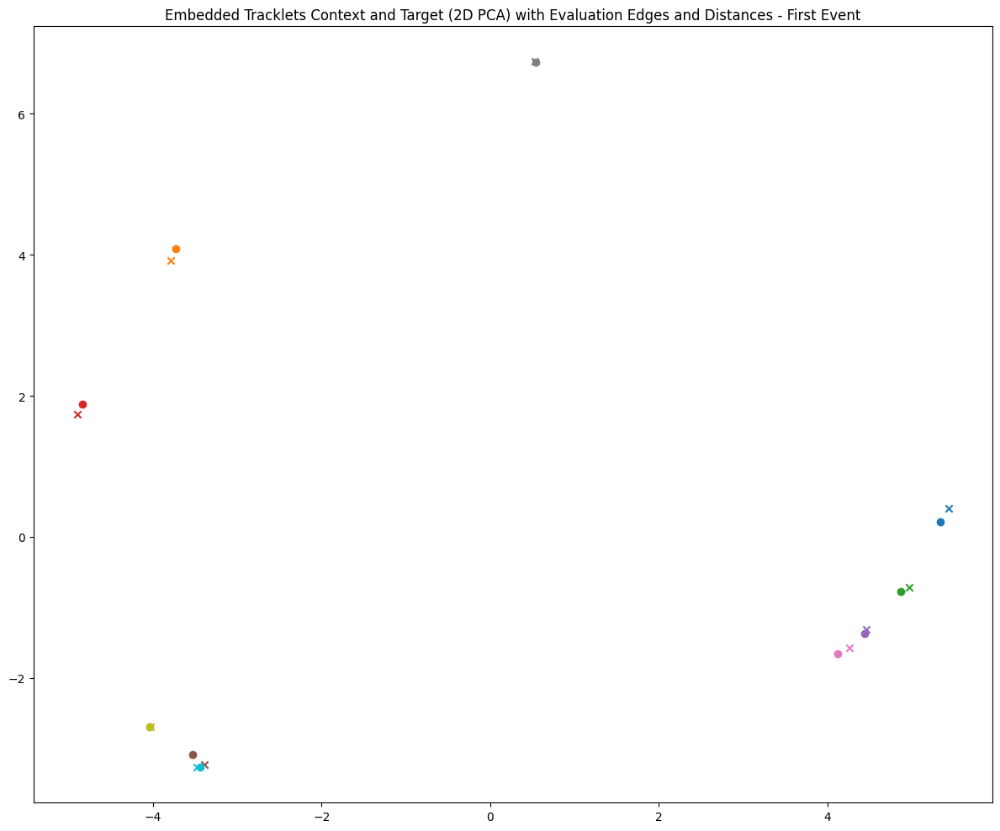

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.1715
  Mean Fake Distance: 6.7938
Epoch 3: 100%|██████████| 100/100 [00:24<00:00,  4.13it/s, v_num=2xdj]

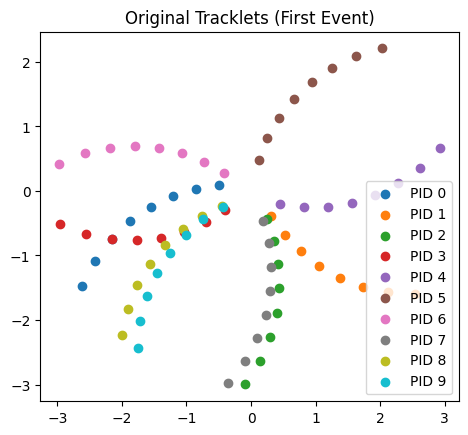

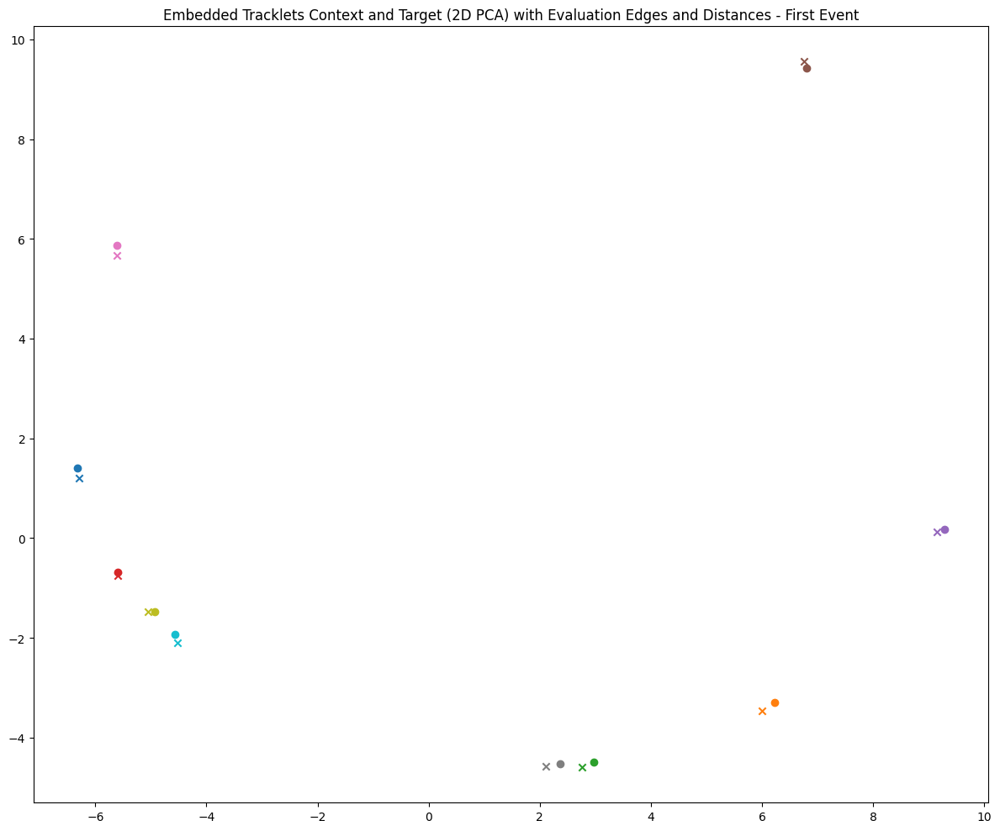

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.1845
  Mean Fake Distance: 9.9998
Epoch 4: 100%|██████████| 100/100 [00:22<00:00,  4.37it/s, v_num=2xdj]

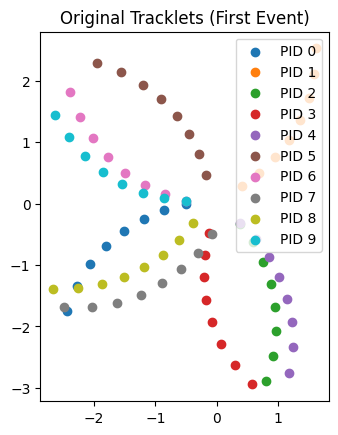

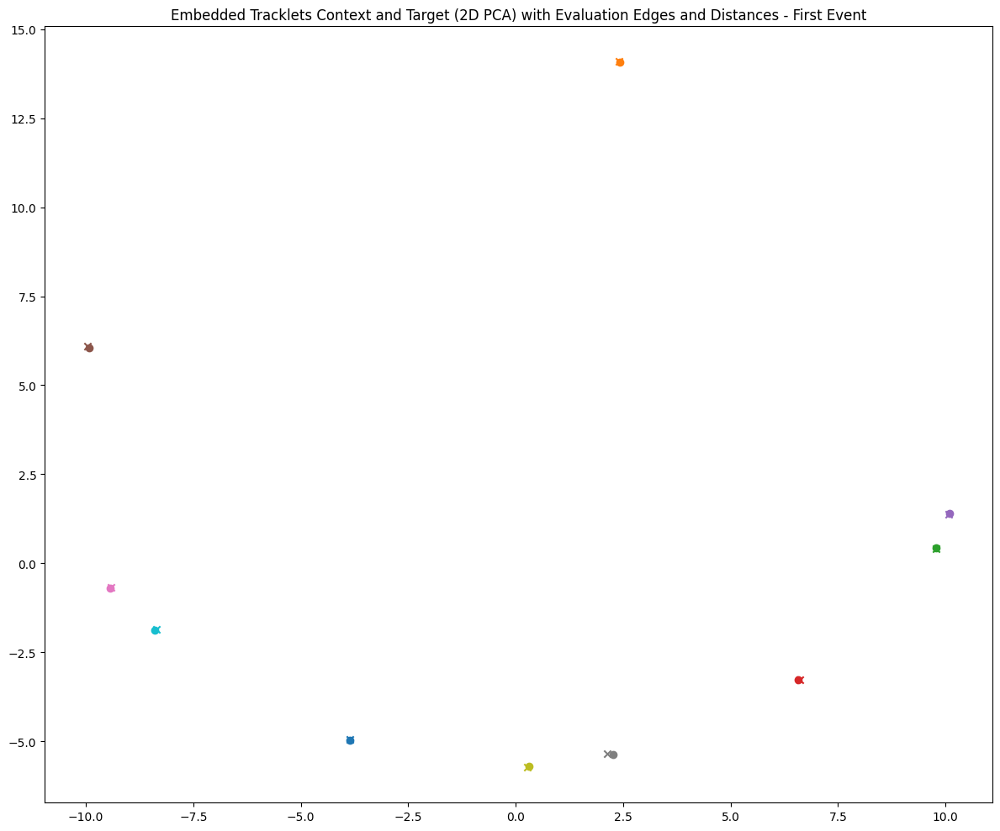

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.1286
  Mean Fake Distance: 12.9594
Epoch 5: 100%|██████████| 100/100 [00:23<00:00,  4.27it/s, v_num=2xdj]

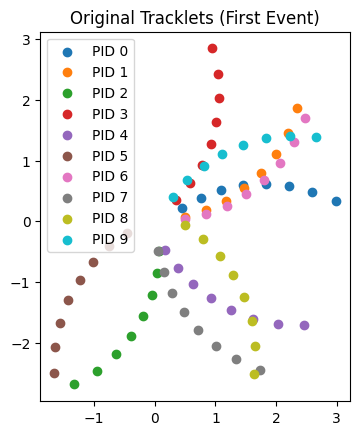

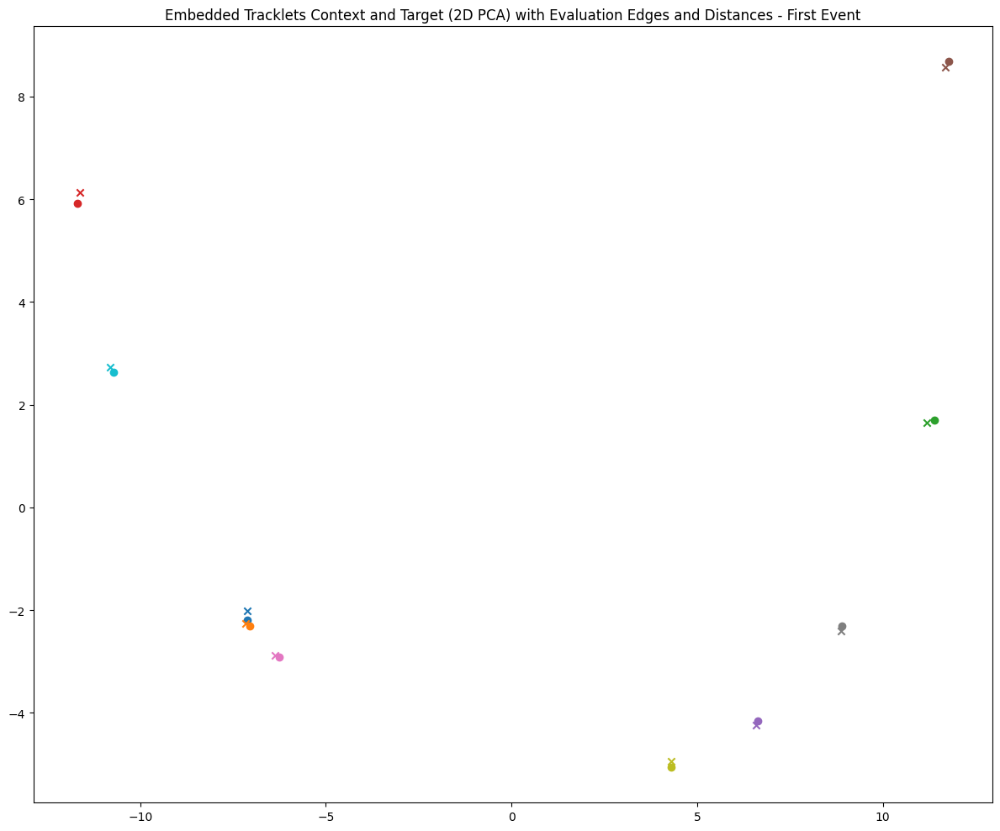

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.1777
  Mean Fake Distance: 15.2820
Epoch 6: 100%|██████████| 100/100 [00:21<00:00,  4.74it/s, v_num=2xdj]

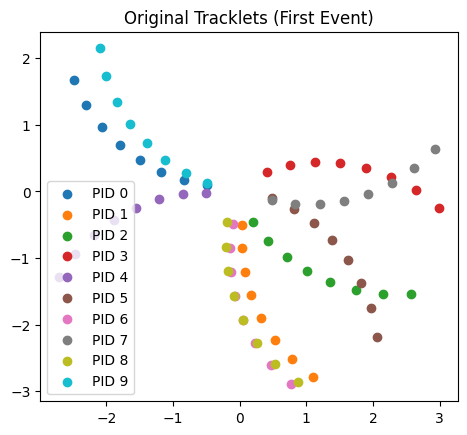

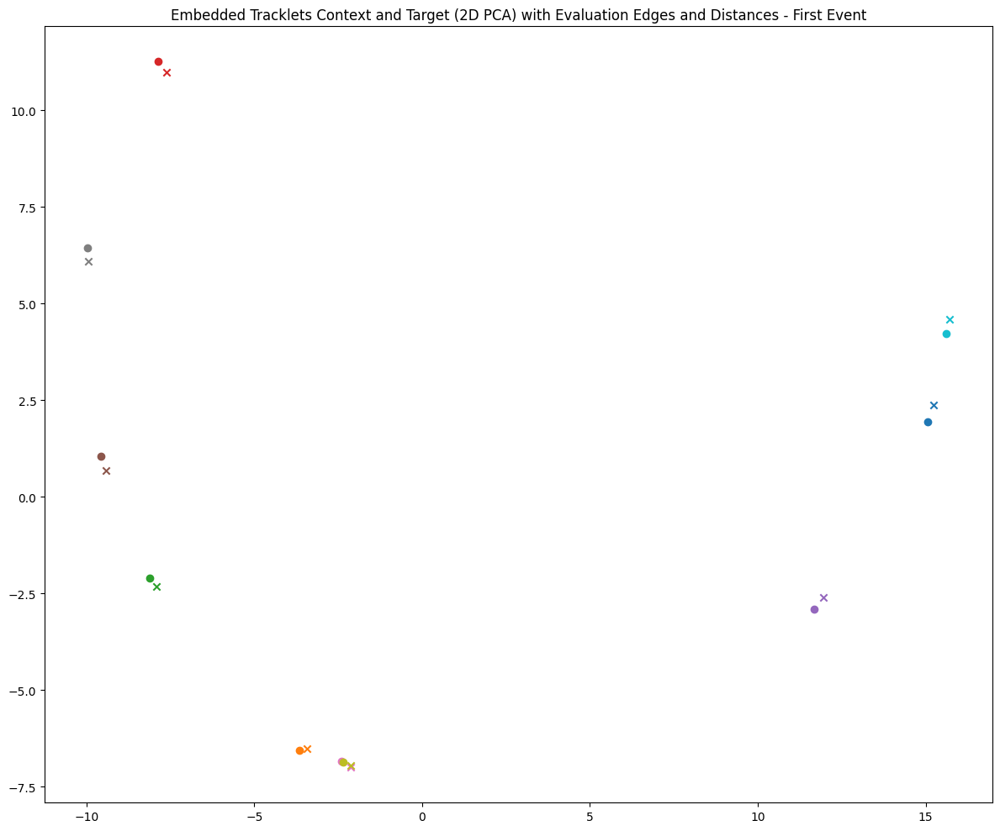

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.3272
  Mean Fake Distance: 17.1349
Epoch 7: 100%|██████████| 100/100 [00:22<00:00,  4.35it/s, v_num=2xdj]

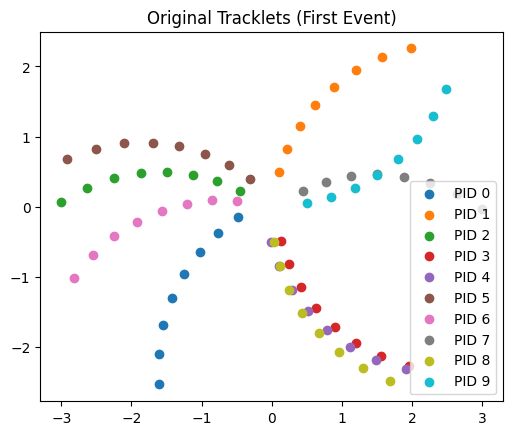

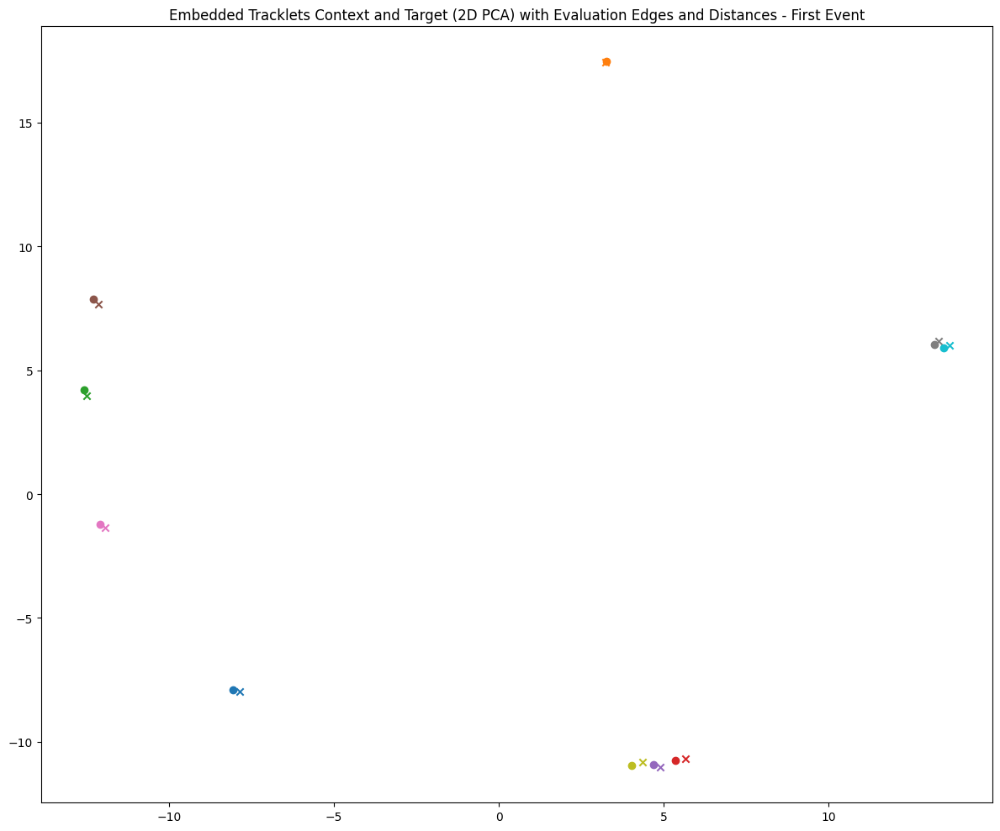

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.2320
  Mean Fake Distance: 18.4284
Epoch 8: 100%|██████████| 100/100 [00:22<00:00,  4.49it/s, v_num=2xdj]

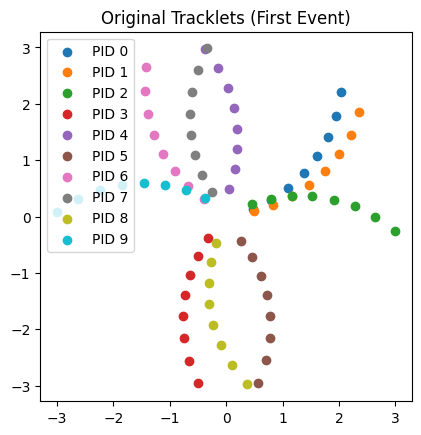

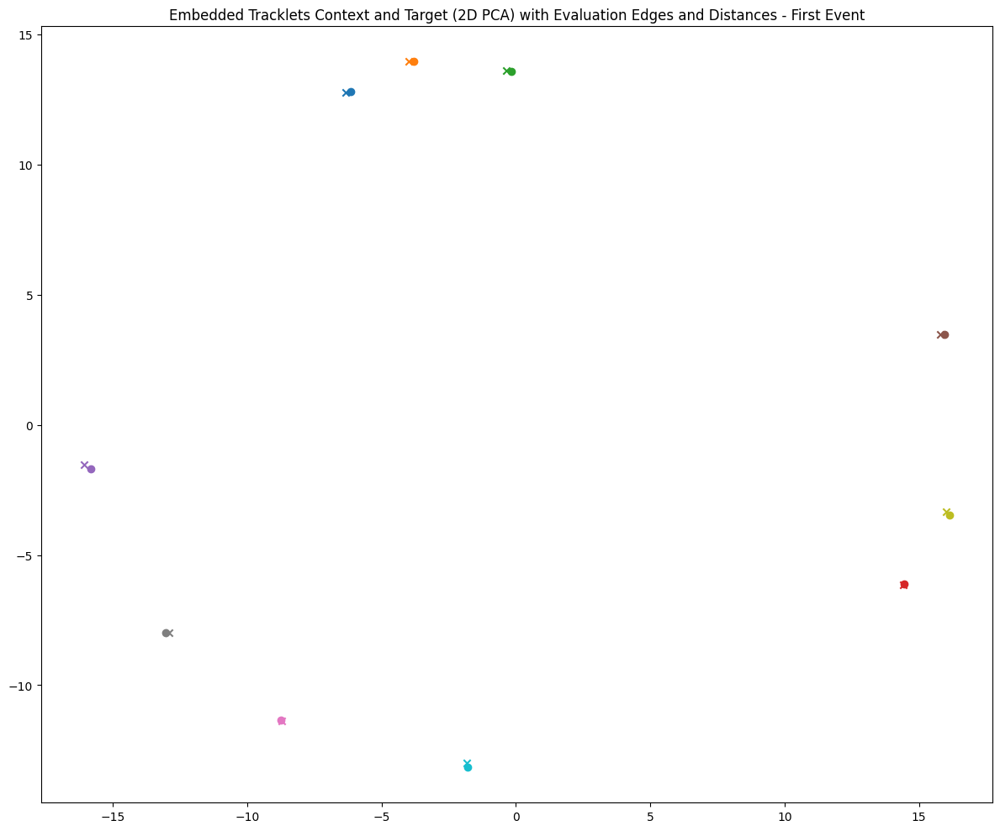

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.1617
  Mean Fake Distance: 19.7740
Epoch 9: 100%|██████████| 100/100 [00:22<00:00,  4.52it/s, v_num=2xdj]

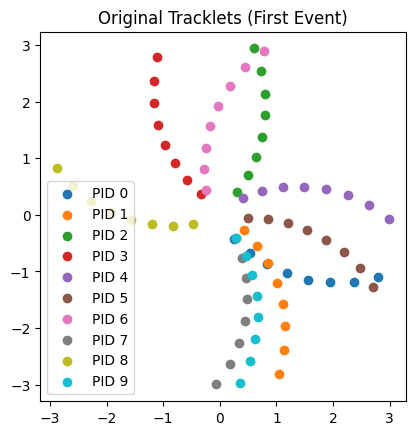

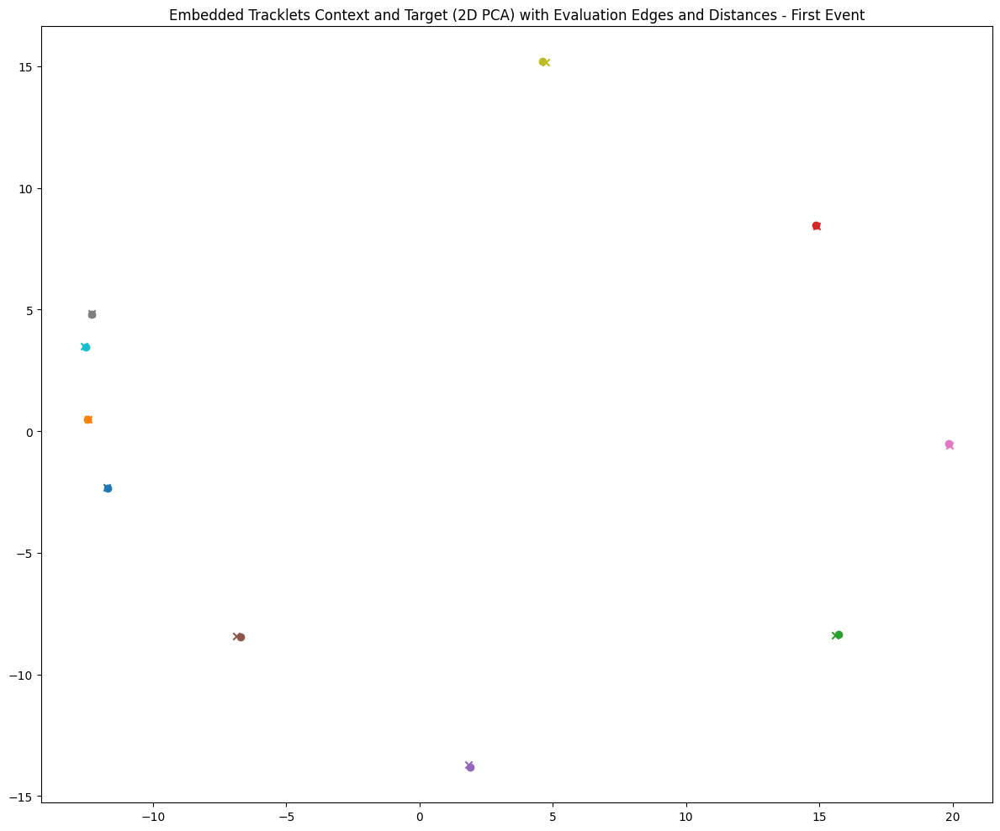

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.1513
  Mean Fake Distance: 20.6495
Epoch 9: 100%|██████████| 100/100 [00:32<00:00,  3.10it/s, v_num=2xdj]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 100/100 [00:32<00:00,  3.10it/s, v_num=2xdj]


In [4]:
wandb_logger = WandbLogger(project="JEPA_toytrack_splittracks")
trainer = L.Trainer(
    max_epochs=10, 
    devices=1, 
    accelerator="gpu", 
    limit_train_batches = config["train_batches"], 
    limit_val_batches = config["val_batches"],
    logger = wandb_logger,
)
trainer.fit(model=model)

## Embedding Visualisation

In [2]:
checkpoint_path = "/global/cfs/cdirs/m3443/usr/dtmurnane/Side_Work/Particle-JEPA/notebooks/JEPA_toytrack_splittracks/rsmt2xdj/checkpoints/epoch=9-step=1000.ckpt"

# Use lightning load
model = JEPA.load_from_checkpoint(checkpoint_path).to("cuda")

# Set the model to also have a larger batch size
model.hparams["batch_size"] = 2000

Batch shapes: x=torch.Size([2000, 20, 4, 2]), mask=torch.Size([2000, 20, 4]), pids=torch.Size([2000, 20]), edge_index=torch.Size([2000, 190, 2]), edge_mask=torch.Size([2000, 190]), y=torch.Size([2000, 190])
Max edge index: 19
Distances shape: torch.Size([380000])
Sample distances: tensor([ 0.1132,  6.7850,  0.9438, 28.3057, 27.7212], device='cuda:0')


/global/homes/d/danieltm/.conda/envs/jepa/lib/python3.10/site-packages/lightning/pytorch/core/module.py:436: You are trying to `self.log()` but the `self.trainer` reference is not registered on the model yet. This is most likely because the model hasn't been passed to the `Trainer`


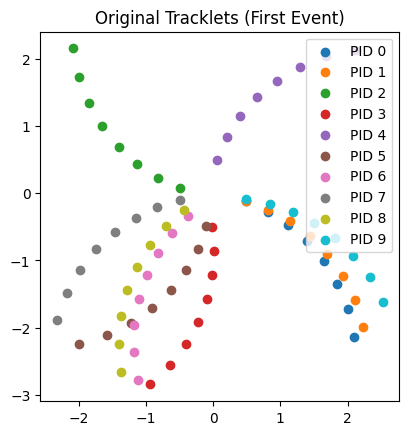

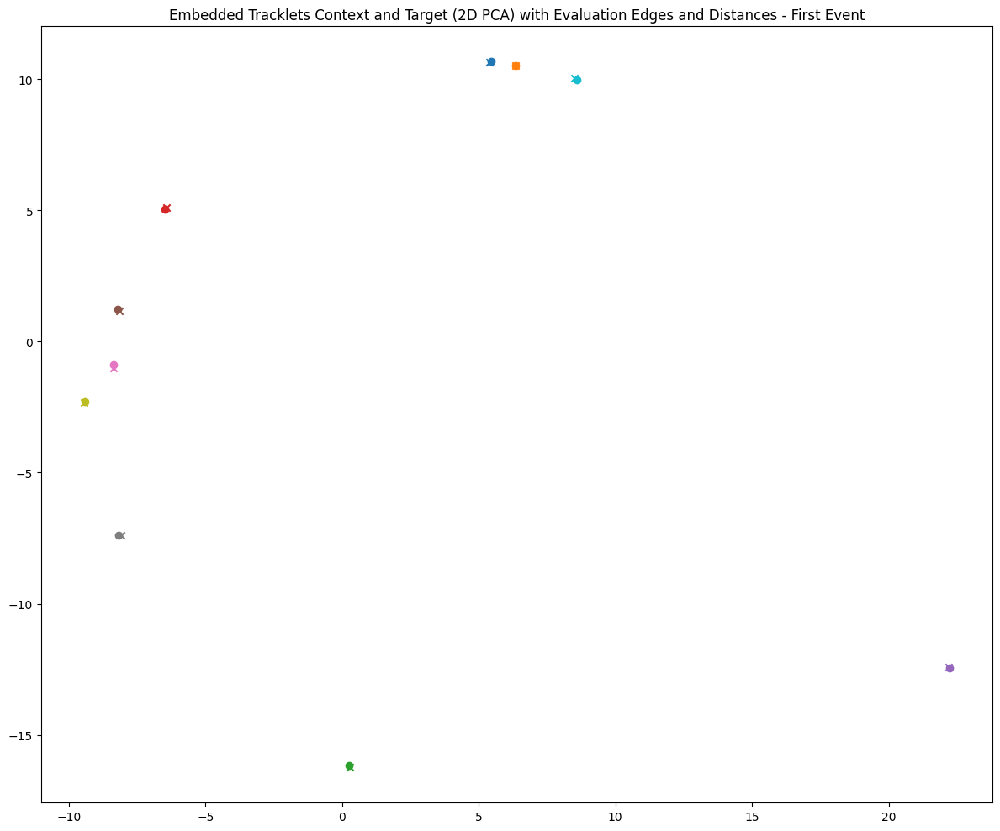

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.1518
  Mean Fake Distance: 20.4842


In [3]:
# Make sure the model has low pT tracks
model.hparams["dataset_args"]["particle_guns"][0]["pt"] = [2.5,2.6]

# Get dataloader
dataloader = model.train_dataloader()

# Get a batch
batch = next(iter(dataloader))

with torch.no_grad():
    batch = {k: v.to("cuda") if isinstance(v, torch.Tensor) else v for k, v in batch.items()}
    results = model.shared_evaluation(batch, batch_idx=0)

# Get the embeddings
low_pt_embeddings = results["embedded_context_tracklets"].cpu().numpy()

Batch shapes: x=torch.Size([2000, 20, 4, 2]), mask=torch.Size([2000, 20, 4]), pids=torch.Size([2000, 20]), edge_index=torch.Size([2000, 190, 2]), edge_mask=torch.Size([2000, 190]), y=torch.Size([2000, 190])
Max edge index: 19
Distances shape: torch.Size([380000])
Sample distances: tensor([ 0.2601, 25.5747, 24.0040, 13.6843, 12.3818], device='cuda:0')


/global/homes/d/danieltm/.conda/envs/jepa/lib/python3.10/site-packages/lightning/pytorch/core/module.py:436: You are trying to `self.log()` but the `self.trainer` reference is not registered on the model yet. This is most likely because the model hasn't been passed to the `Trainer`


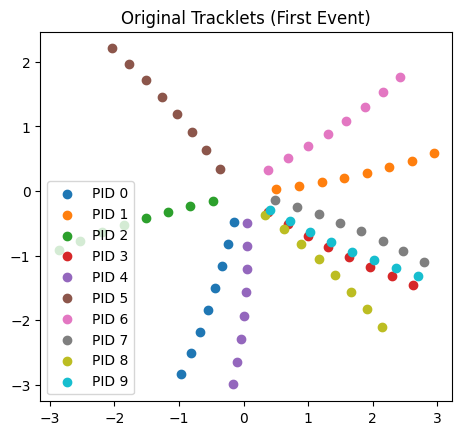

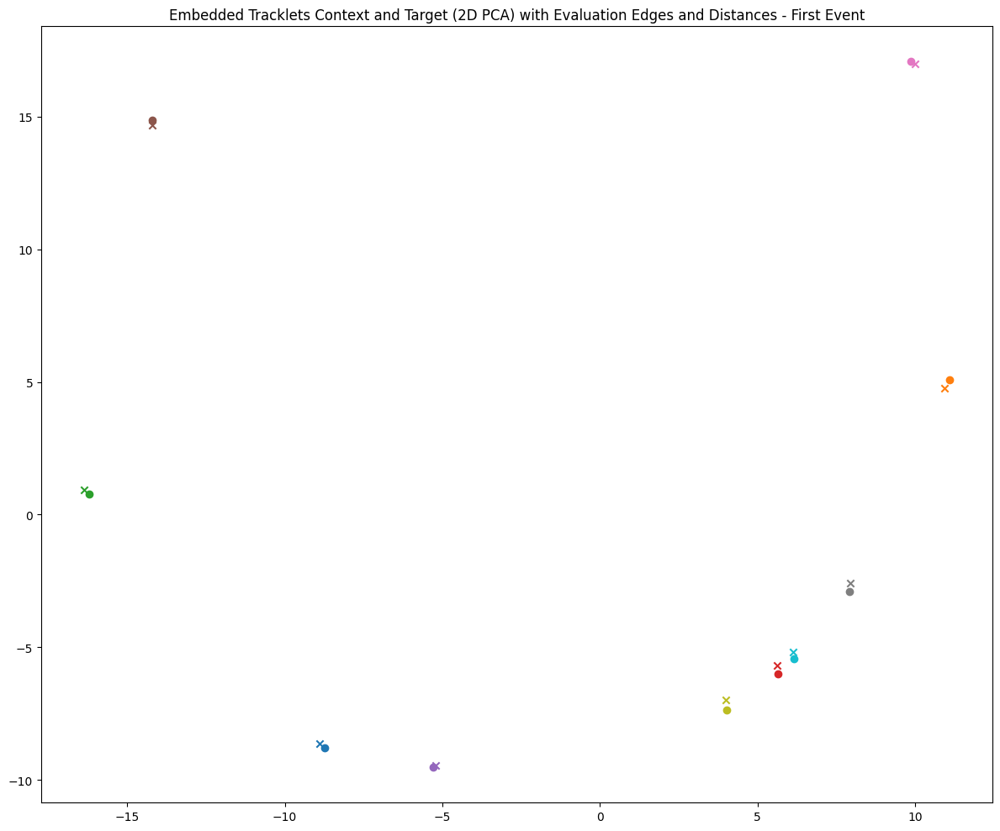

First Batch Metrics:
  Efficiency: 0.0000
  Purity: 0.0000
  Mean True Distance: 0.2310
  Mean Fake Distance: 20.4336


In [4]:
# Make sure the model has low pT tracks
model.hparams["dataset_args"]["particle_guns"][0]["pt"] = [10, 11]

# Get dataloader
dataloader = model.train_dataloader()

# Get a batch
batch = next(iter(dataloader))

with torch.no_grad():
    batch = {k: v.to("cuda") if isinstance(v, torch.Tensor) else v for k, v in batch.items()}
    results = model.shared_evaluation(batch, batch_idx=0)

# Get the embeddings
high_pt_embeddings = results["embedded_context_tracklets"].cpu().numpy()

In [9]:
# Plot ALL the embeddings in PCA

from sklearn.decomposition import PCA

# Select embeddings for the first batch entry
low_pt_embeddings = low_pt_embeddings.reshape(-1, 8)  # Shape: (400*20, 8)
high_pt_embeddings = high_pt_embeddings.reshape(-1, 8)  # Shape: (400*20, 8)

# Concatenate low and high pT embeddings for the first batch
all_embeddings = np.concatenate([low_pt_embeddings, high_pt_embeddings], axis=0)  # Shape: (2*400*20, 8)

# Perform PCA on the concatenated embeddings
pca = PCA(n_components=2)
all_embeddings_pca = pca.fit_transform(all_embeddings)  # Shape: (2*400*20, 2)

# Create a mask for low and high pT embeddings
num_low_pt = low_pt_embeddings.shape[0]  # 400*20
num_high_pt = high_pt_embeddings.shape[0]  # 400*20

low_pt_mask = np.ones(num_low_pt, dtype=bool)       # [True, True, ..., True] (400*20,)
high_pt_mask = np.zeros(num_high_pt, dtype=bool)    # [False, False, ..., False] (400*20,)
pt_mask = np.concatenate([low_pt_mask, high_pt_mask])  # Shape: (2*400*20,)

# Plot the PCA results
plt.figure(figsize=(24, 24), dpi=600)
plt.scatter(
    all_embeddings_pca[pt_mask, 0],
    all_embeddings_pca[pt_mask, 1],
    c="r",
    marker='o',
    label='Low pT',
    s=0.1
)
plt.scatter(
    all_embeddings_pca[~pt_mask, 0],
    all_embeddings_pca[~pt_mask, 1],
    c="b",
    marker='^',
    label='High pT',
    s=0.1
)
plt.legend()
plt.title('PCA of Low and High pT Embeddings')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()

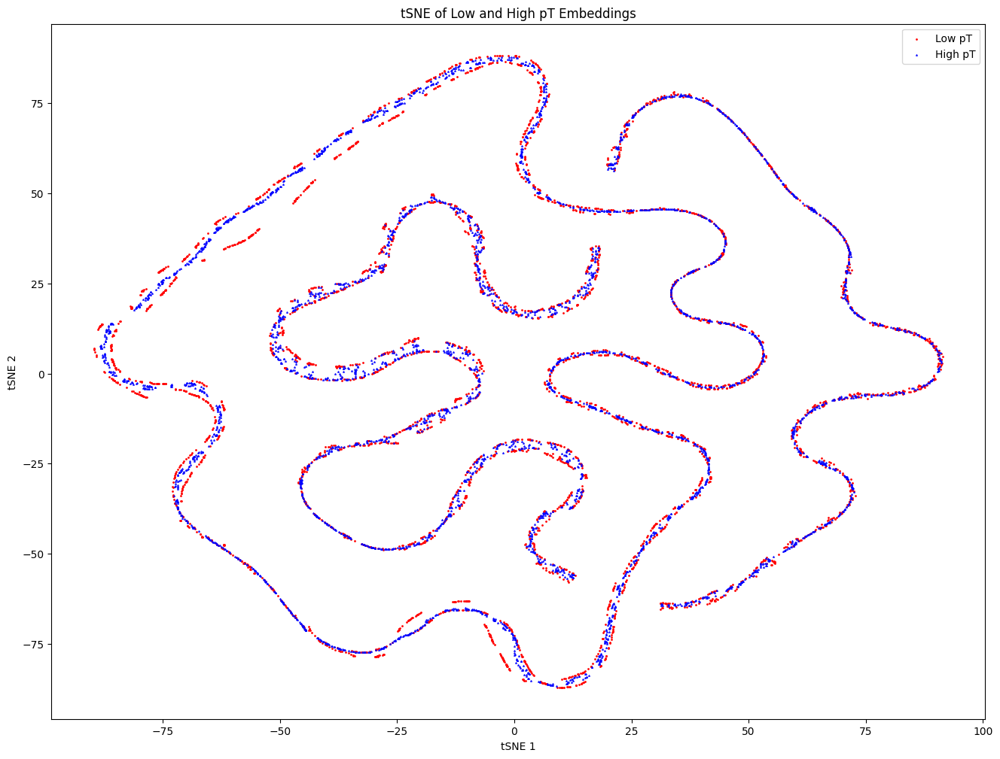

In [6]:
# Plot ALL the embeddings in tSNE
from sklearn.manifold import TSNE

# Perform PCA on the concatenated embeddings
tsne = TSNE(n_components=2)
all_embeddings_tsne = tsne.fit_transform(all_embeddings)  # Shape: (2*400*20, 2)

# Plot the PCA results
plt.figure(figsize=(16, 12))
plt.scatter(
    all_embeddings_tsne[pt_mask, 0],
    all_embeddings_tsne[pt_mask, 1],
    c="r",
    marker='o',
    label='Low pT',
    s=1
)
plt.scatter(
    all_embeddings_tsne[~pt_mask, 0],
    all_embeddings_tsne[~pt_mask, 1],
    c="b",
    marker='^',
    label='High pT',
    s=1
)
plt.legend()
plt.title('tSNE of Low and High pT Embeddings')
plt.xlabel('tSNE 1')
plt.ylabel('tSNE 2')
plt.show()

In [9]:
def run_tsne(all_embeddings, pt_mask, perplexities=[5, 10, 20], max_iters=[300, 500], learning_rates=[10, 100], intermediate_dim=4):
    from sklearn.manifold import TSNE
    import matplotlib.pyplot as plt

    # First apply dimensionality reduction with PCA
    # pca = PCA(n_components=intermediate_dim)
    # all_embeddings_pca = pca.fit_transform(all_embeddings)

    for perplexity in perplexities:
        for max_iter in max_iters:
            for lr in learning_rates:
                print(f"Running t-SNE with perplexity={perplexity}, max_iter={max_iter}, learning_rate={lr}")
                tsne = TSNE(
                    n_components=2,
                    perplexity=perplexity,
                    max_iter=max_iter,
                    learning_rate=lr,
                    early_exaggeration=10,  # Reduced from default 12
                    method='barnes_hut',
                    verbose=1
                )
                all_embeddings_tsne = tsne.fit_transform(all_embeddings_pca)

                # Plotting
                plt.figure(figsize=(16, 12))
                plt.scatter(
                    all_embeddings_tsne[pt_mask, 0],
                    all_embeddings_tsne[pt_mask, 1],
                    c="r",
                    marker='o',
                    label='Low pT',
                    s=1
                )
                plt.scatter(
                    all_embeddings_tsne[~pt_mask, 0],
                    all_embeddings_tsne[~pt_mask, 1],
                    c="b",
                    marker='^',
                    label='High pT',
                    s=1
                )
                plt.legend()
                plt.title(f'tSNE (perplexity={perplexity}, max_iter={max_iter}, lr={lr})')
                plt.xlabel('tSNE 1')
                plt.ylabel('tSNE 2')
                plt.show()

Running t-SNE with perplexity=100, max_iter=500, learning_rate=1000
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8000 samples in 0.004s...
[t-SNE] Computed neighbors for 8000 samples in 0.352s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8000
[t-SNE] Computed conditional probabilities for sample 2000 / 8000
[t-SNE] Computed conditional probabilities for sample 3000 / 8000
[t-SNE] Computed conditional probabilities for sample 4000 / 8000
[t-SNE] Computed conditional probabilities for sample 5000 / 8000
[t-SNE] Computed conditional probabilities for sample 6000 / 8000
[t-SNE] Computed conditional probabilities for sample 7000 / 8000
[t-SNE] Computed conditional probabilities for sample 8000 / 8000
[t-SNE] Mean sigma: 0.802584
[t-SNE] KL divergence after 250 iterations with early exaggeration: 38.726837
[t-SNE] KL divergence after 500 iterations: 0.263431


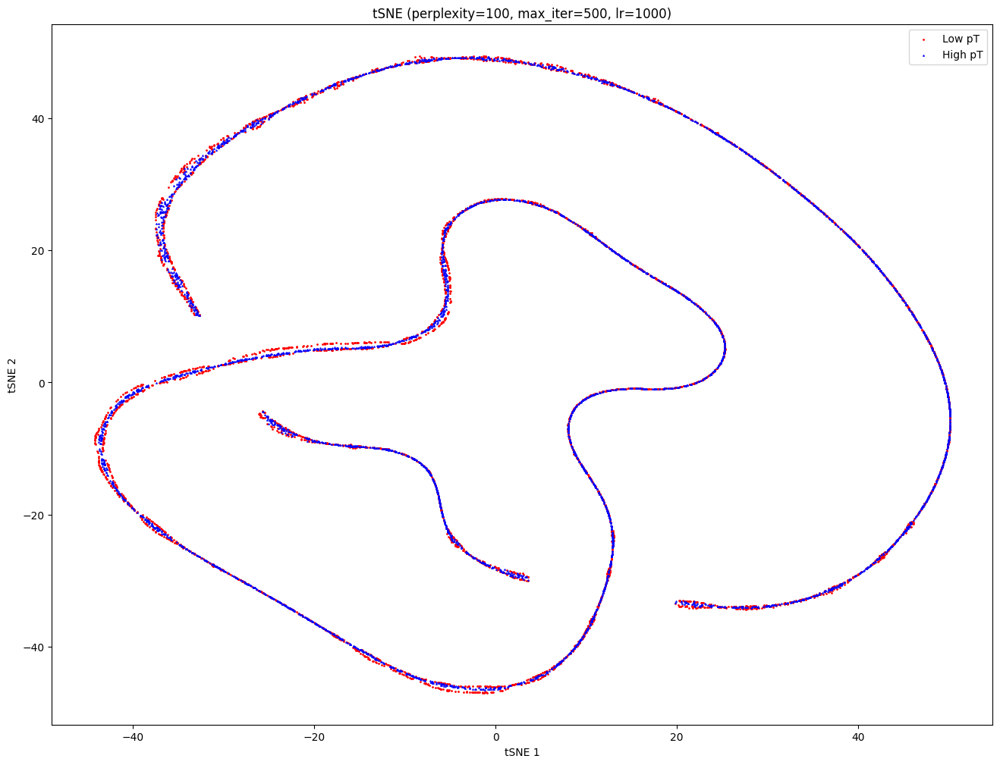

Running t-SNE with perplexity=100, max_iter=500, learning_rate=10000
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8000 samples in 0.004s...
[t-SNE] Computed neighbors for 8000 samples in 0.349s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8000
[t-SNE] Computed conditional probabilities for sample 2000 / 8000
[t-SNE] Computed conditional probabilities for sample 3000 / 8000
[t-SNE] Computed conditional probabilities for sample 4000 / 8000
[t-SNE] Computed conditional probabilities for sample 5000 / 8000
[t-SNE] Computed conditional probabilities for sample 6000 / 8000
[t-SNE] Computed conditional probabilities for sample 7000 / 8000
[t-SNE] Computed conditional probabilities for sample 8000 / 8000
[t-SNE] Mean sigma: 0.802584
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.364620
[t-SNE] KL divergence after 500 iterations: 0.289212


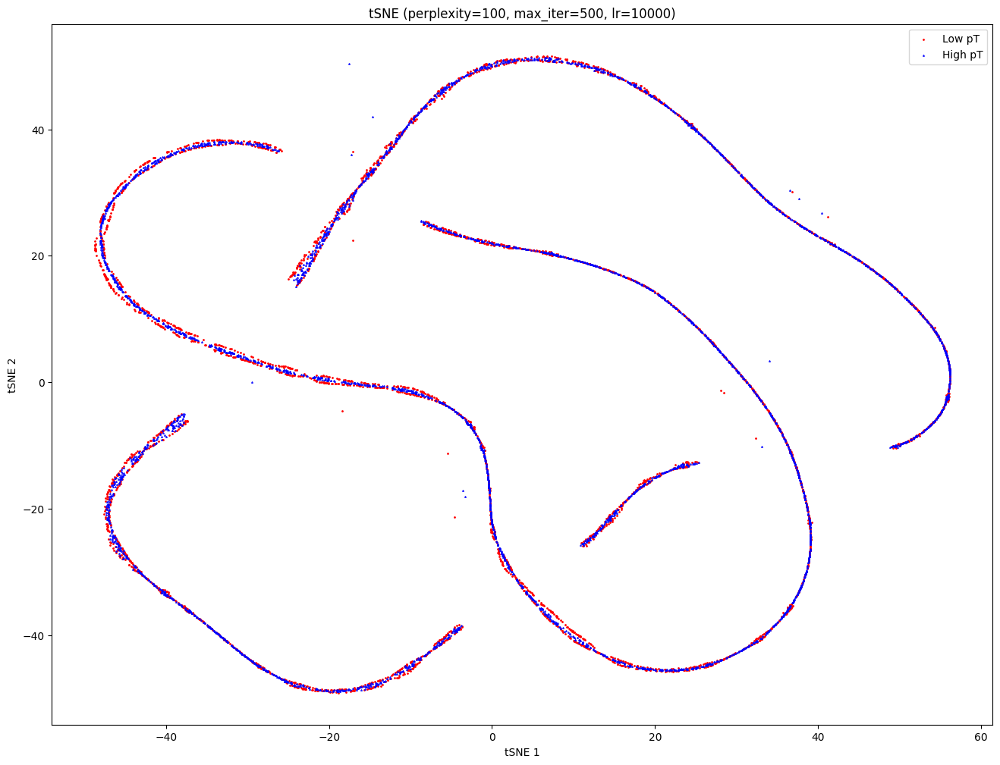

Running t-SNE with perplexity=100, max_iter=1000, learning_rate=1000
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8000 samples in 0.005s...
[t-SNE] Computed neighbors for 8000 samples in 0.350s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8000
[t-SNE] Computed conditional probabilities for sample 2000 / 8000
[t-SNE] Computed conditional probabilities for sample 3000 / 8000
[t-SNE] Computed conditional probabilities for sample 4000 / 8000
[t-SNE] Computed conditional probabilities for sample 5000 / 8000
[t-SNE] Computed conditional probabilities for sample 6000 / 8000
[t-SNE] Computed conditional probabilities for sample 7000 / 8000
[t-SNE] Computed conditional probabilities for sample 8000 / 8000
[t-SNE] Mean sigma: 0.802584
[t-SNE] KL divergence after 250 iterations with early exaggeration: 38.728565
[t-SNE] KL divergence after 1000 iterations: 0.237397


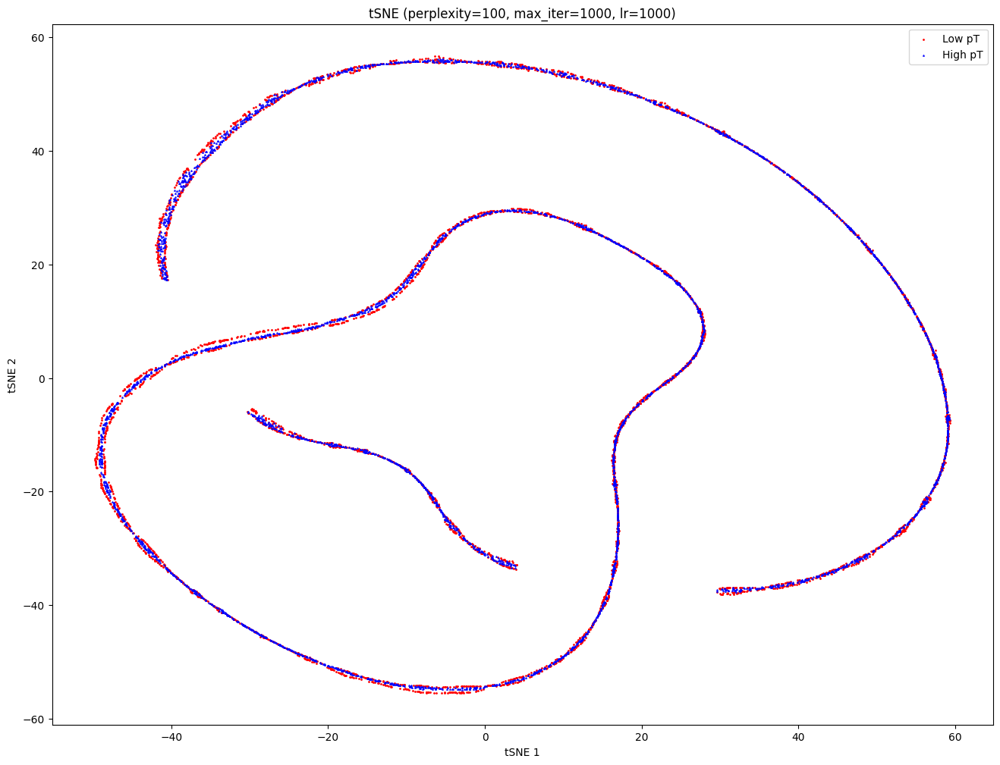

Running t-SNE with perplexity=100, max_iter=1000, learning_rate=10000
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8000 samples in 0.004s...
[t-SNE] Computed neighbors for 8000 samples in 0.348s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8000
[t-SNE] Computed conditional probabilities for sample 2000 / 8000
[t-SNE] Computed conditional probabilities for sample 3000 / 8000
[t-SNE] Computed conditional probabilities for sample 4000 / 8000
[t-SNE] Computed conditional probabilities for sample 5000 / 8000
[t-SNE] Computed conditional probabilities for sample 6000 / 8000
[t-SNE] Computed conditional probabilities for sample 7000 / 8000
[t-SNE] Computed conditional probabilities for sample 8000 / 8000
[t-SNE] Mean sigma: 0.802584
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.438339
[t-SNE] KL divergence after 1000 iterations: 0.255056


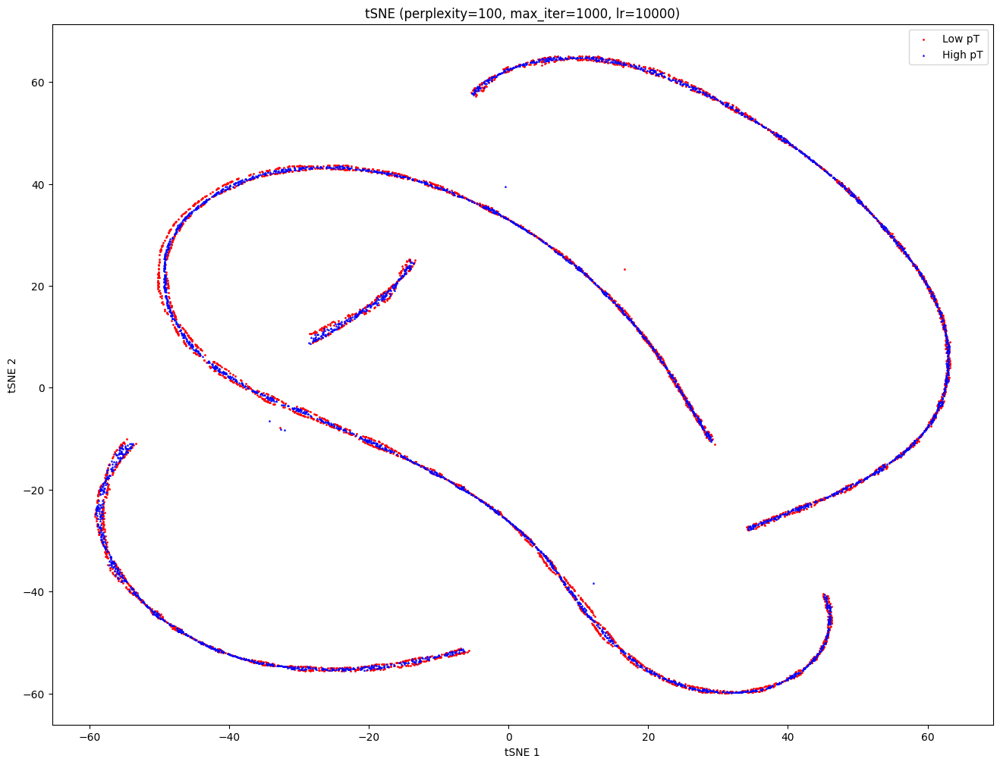

Running t-SNE with perplexity=100, max_iter=2000, learning_rate=1000
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8000 samples in 0.004s...
[t-SNE] Computed neighbors for 8000 samples in 0.368s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8000
[t-SNE] Computed conditional probabilities for sample 2000 / 8000
[t-SNE] Computed conditional probabilities for sample 3000 / 8000
[t-SNE] Computed conditional probabilities for sample 4000 / 8000
[t-SNE] Computed conditional probabilities for sample 5000 / 8000
[t-SNE] Computed conditional probabilities for sample 6000 / 8000
[t-SNE] Computed conditional probabilities for sample 7000 / 8000
[t-SNE] Computed conditional probabilities for sample 8000 / 8000
[t-SNE] Mean sigma: 0.802584
[t-SNE] KL divergence after 250 iterations with early exaggeration: 38.731335
[t-SNE] KL divergence after 2000 iterations: 0.225874


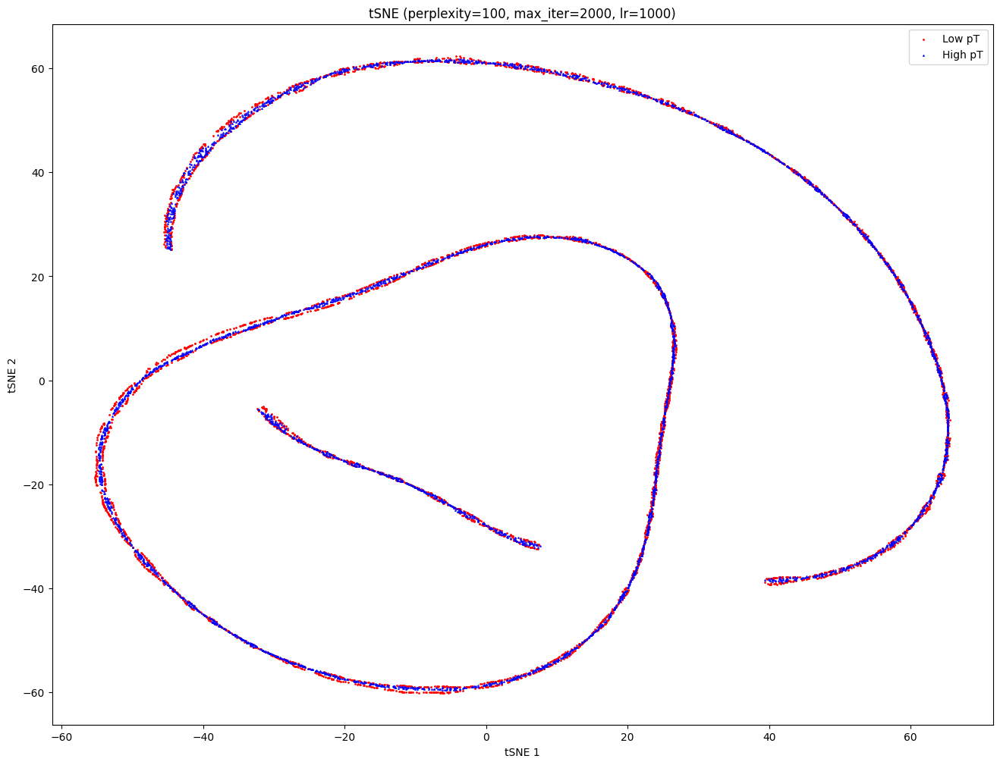

Running t-SNE with perplexity=100, max_iter=2000, learning_rate=10000
[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8000 samples in 0.004s...
[t-SNE] Computed neighbors for 8000 samples in 0.364s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8000
[t-SNE] Computed conditional probabilities for sample 2000 / 8000
[t-SNE] Computed conditional probabilities for sample 3000 / 8000
[t-SNE] Computed conditional probabilities for sample 4000 / 8000
[t-SNE] Computed conditional probabilities for sample 5000 / 8000
[t-SNE] Computed conditional probabilities for sample 6000 / 8000
[t-SNE] Computed conditional probabilities for sample 7000 / 8000
[t-SNE] Computed conditional probabilities for sample 8000 / 8000
[t-SNE] Mean sigma: 0.802584
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.545410
[t-SNE] KL divergence after 2000 iterations: 0.245641


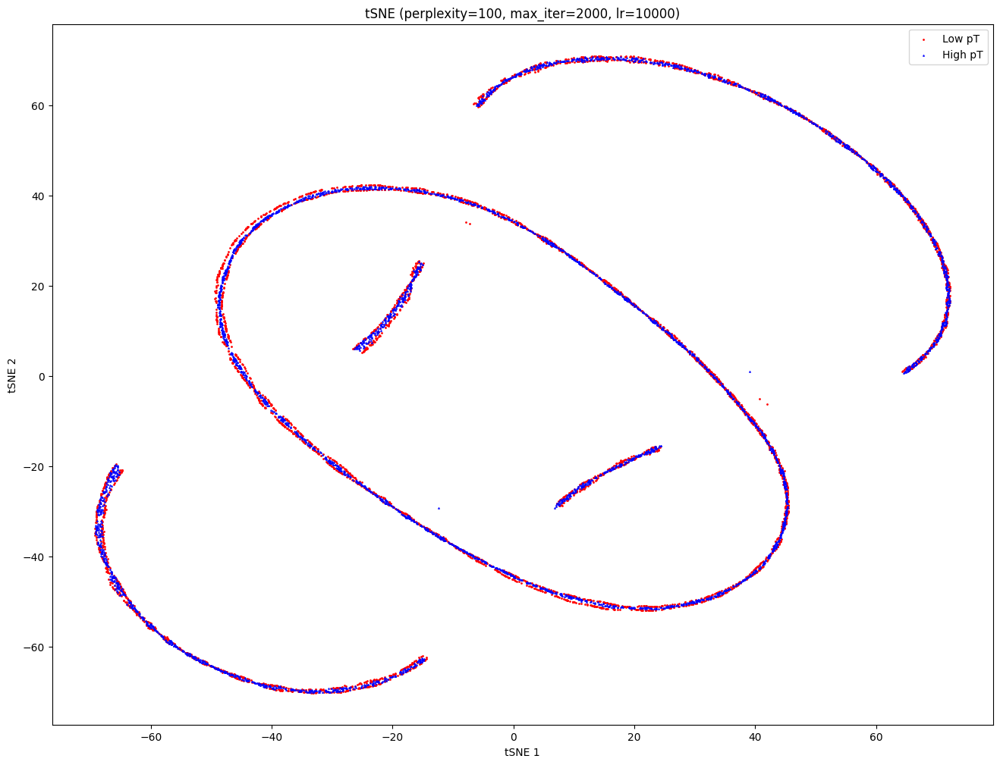

In [15]:
run_tsne(all_embeddings, pt_mask, perplexities=[100], max_iters=[500, 1000, 2000], learning_rates=[1000, 10000])

In [9]:
from parametric_tSNE import Parametric_tSNE

input_dim = all_embeddings.shape[1]
output_dim = 2
perplexity = 10

ptSNE = Parametric_tSNE(
    input_dim,
    output_dim,
    perplexity
)

ptSNE.fit(all_embeddings, epochs=1, verbose=1)

all_embeddings_ptSNE = ptSNE.transform(all_embeddings)

2024-09-27 06:34:21.024793: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-27 06:34:21.065880: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-27 06:34:21.075115: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-27 06:34:21.133453: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-27 06:34:23.735806: W tensorflow/compiler/tf2

2024-09-27 06:34:28.067891: Pretraining 4 layers


: 

In [1]:
# Plot
plt.figure(figsize=(16, 12))
plt.scatter(
    all_embeddings_ptSNE[pt_mask, 0],
    all_embeddings_ptSNE[pt_mask, 1],
    c="r",
    marker='o',
    label='Low pT',
    s=1
)
plt.scatter(
    all_embeddings_ptSNE[~pt_mask, 0],
    all_embeddings_ptSNE[~pt_mask, 1],
    c="b",
    marker='^',
    label='High pT',
    s=1
)
plt.legend()
plt.title('tSNE of Low and High pT Embeddings')
plt.xlabel('tSNE 1')
plt.ylabel('tSNE 2')
plt.show()

NameError: name 'plt' is not defined